<a href="https://colab.research.google.com/github/BenoitFries/DataScience/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to end multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow hub.

## 1.0 Problem

Identifying the breed of a dog given an image of a dog.

## 2.0 Data

The data we are using is from Kaggle's dog breed identification competition. 

https://www.kaggle.com/c/dog-breed-identification/data

## 3.0 Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4.0 Features

Some information about the data:
* We are dealing with images (unstructured data) so it's probably best we use deep learning / transfer learning
* There are 120 breeds of dog (120 different classes)
* There are around 10K+ images in the training set (images + labels)
* There are around 10K+ images in the test set (images only)

## Get your workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we are using a GPU

In [1]:
# import Tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: "+tf.__version__)
print("TF HUB version: "+hub.__version__)

# check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "NOT available")

TF version: 2.7.0
TF HUB version: 0.12.0
GPU available


## Get our data ready (turn data into tensors)

With all machine learning models, data has to be in numerical format. Turning our images into tensors (numerical representation)



In [2]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/DogVision/labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


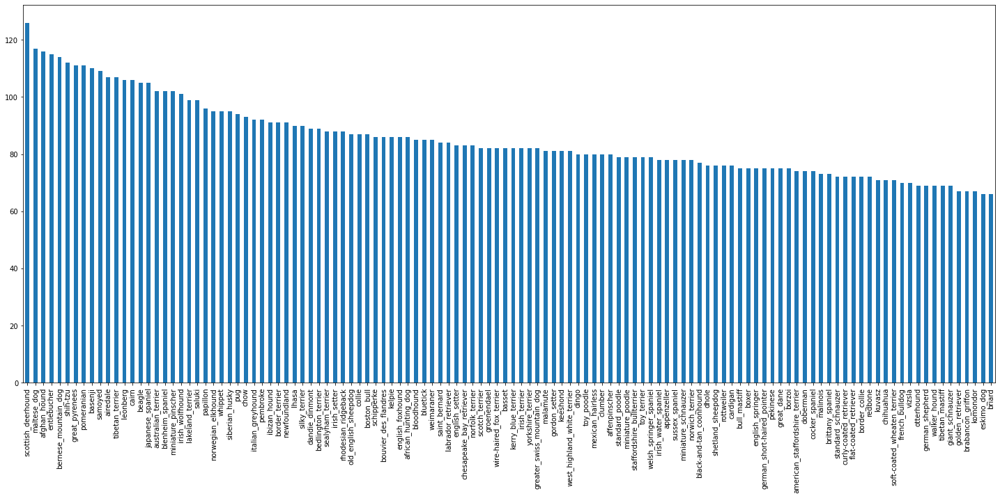

In [4]:
#How many images are there of each breed ?
labels_csv["breed"].value_counts().plot.bar(figsize=(25,10))

In [5]:
labels_csv["breed"].value_counts().median()

82.0

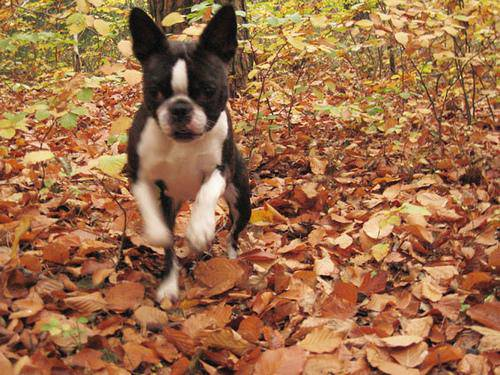

In [6]:
# Let's view an image
from IPython.display import Image
Image('drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

In [7]:
filenames = ['drive/MyDrive/DogVision/train/' + fname + ".jpg" for fname in labels_csv['id']]

In [8]:
# check wheter number of filenames matches number of files

import os 
if len(os.listdir("drive/MyDrive/DogVision/train")) == len(filenames):
  print("Filenames number matches our array :)")
else:
  print("Filenames number DO NOT matches our array :(")

Filenames number matches our array :)


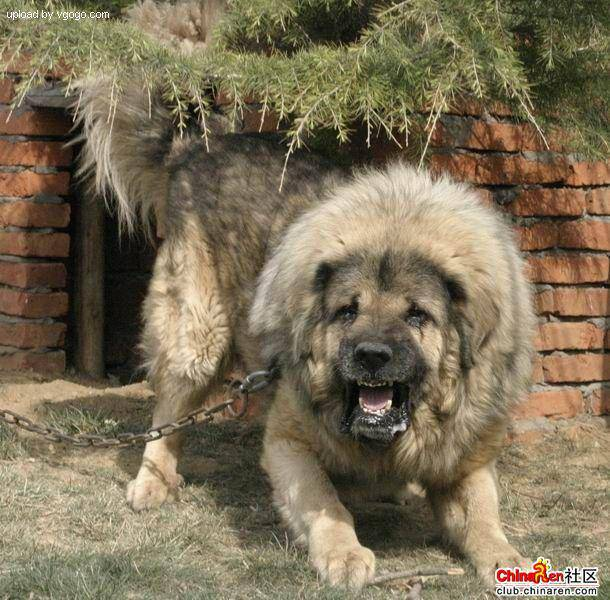

In [9]:
Image(filenames[9000])

In [10]:
import numpy as np

labels = labels_csv["breed"].to_numpy()
labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
len(labels)

10222

In [12]:
if (len(labels) == len(filenames)):
  print("Number of labels matches number of filenames :)")
else:
  print("Number of labels DOES NOT match number of filenames :(")

Number of labels matches number of filenames :)


In [13]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [14]:
# turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [15]:
# turn every label to a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
len(boolean_labels)

10222

In [17]:
# Example: turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set

Since kaggle didn't provide a validation set, we will create it ourselves.

In [18]:
# Setup X and y
X = filenames
y = boolean_labels



Start with 1000 images to experiment, and increase as needed.

In [19]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:10}

In [20]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES], test_size=0.2, random_state=42)

In [21]:
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing images (turning images into tensors)

1. Take an image filepath as input
2. use TensorFlow to read the file and save into a variable image
3. Turn our image into a tensor
4. resize the image to a shape of (224,224)
5. Return the modified image

In [22]:
# convert an image to NumPy

from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [23]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [24]:
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a tensor
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3) # channels = rgb
  # convert 0-255 values to 0.0-1.0 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[img_size,img_size])
  return image


##Turning our data into batches

Batches permit to process multiple tensors without taking too much memory, we will use 32 images per batch.

In [25]:
# return a tuple 
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label



In [26]:
BATCH_SIZE = 32

def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of images (X) and label (y) pairs.
  Shuffles the data if it's training data, but not if it's validation data.
  Also accepts test data as input (no labels)
  """
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  if valid_data: # no need to shuffle
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    # Shuffling before mapping image_process is more efficient
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

In [27]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating valid data batches...


In [28]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [29]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [30]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [31]:
len(train_images), len(train_labels)

(32, 32)

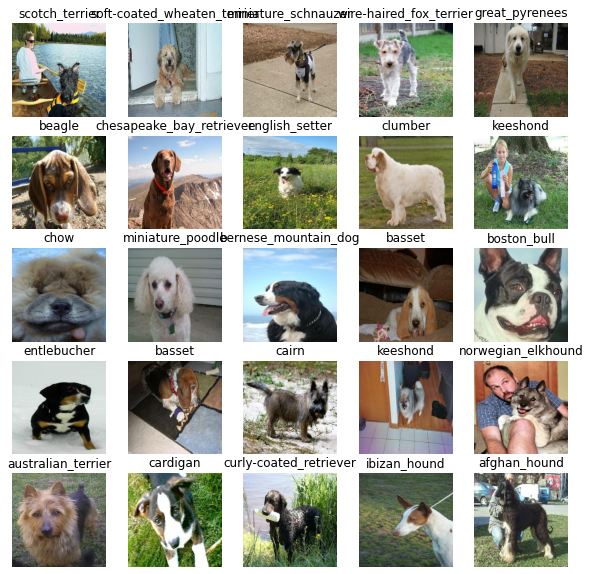

In [32]:
show_25_images(train_images,train_labels)

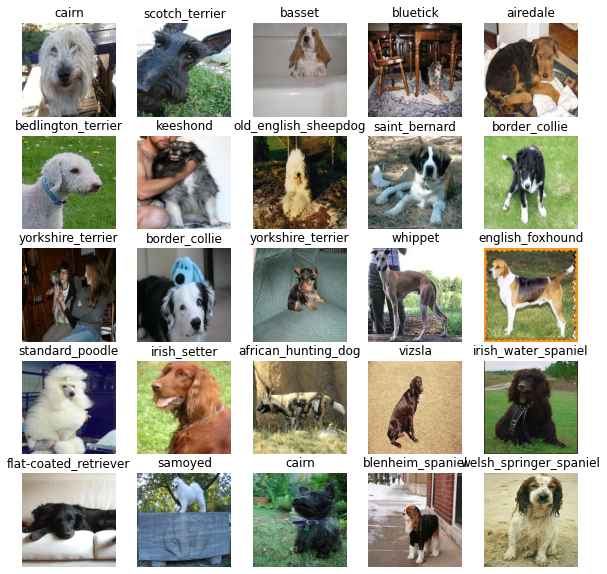

In [33]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

1. Defining the input (images) shape
2. Defining the output (labels) shape
3. URL of the model we want to use from Tensorflow Hub

In [34]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [35]:
def create_model(input_shape=INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: ", model_url)

  model = tf.keras.Sequential([
    hub.KerasLayer(model_url), # layer 1 (input layer)
    tf.keras.layers.Dense(units=output_shape, activation="softmax") # layer 2 (output layer)
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(input_shape)

  return model

In [36]:
model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [37]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

1. One for TensorBoard to track progress
2. One for early stopping if trains too long

In [38]:
%load_ext tensorboard

In [39]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/DogVision/Logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [40]:
# helps avoiding overfitting by stopping if a metric stops improving
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Training a model (on a subset of the data)

In [41]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [42]:
# check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "NOT available")

GPU available


In [43]:
def train_model():
  """
  Trains a given model and returns a trained model
  """
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard,early_stopping])
  return model

In [44]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 115s 3s/step - loss: 4.6103 - accuracy: 0.1050 - val_loss: 3.3593 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 164ms/step - loss: 1.6393 - accuracy: 0.6875 - val_loss: 2.1941 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 4s 162ms/step - loss: 0.5737 - accuracy: 0.9362 - val_loss: 1.6866 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 4s 164ms/step - loss: 0.2604 - accuracy: 0.9850 - val_loss: 1.4610 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 160ms/step - loss: 0.1485 - accuracy: 0.9987 - val_loss: 1.4006 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 3s 139ms/step - loss: 0.1013 - accuracy: 1.0000 - val_loss: 1.3394 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================

In [45]:
# model stopped because it did not improve for 3 epochs
# very good on training set (accuracy 1.0), but not so good on validation (0.66) = overfitting

## Checking the tensorboard logs

In [46]:
%tensorboard --logdir drive/MyDrive/DogVision/Logs

<IPython.core.display.Javascript object>

## Making and evaluation predictions using a trained model

In [47]:
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 110ms/step


array([[5.9168590e-03, 8.2650295e-05, 2.6839252e-03, ..., 5.9411104e-04,
        1.4192135e-05, 1.2395085e-02],
       [3.6389658e-03, 3.6906339e-03, 1.2795838e-02, ..., 9.9611434e-04,
        2.5572514e-03, 1.4287776e-04],
       [3.4412060e-05, 1.1398977e-03, 1.5038945e-04, ..., 8.9560359e-05,
        1.7013313e-04, 1.6822576e-03],
       ...,
       [4.7549593e-06, 3.3895274e-05, 5.7384237e-05, ..., 6.6952925e-06,
        3.7547394e-05, 1.3409222e-05],
       [1.0237150e-02, 2.2573072e-04, 7.1079339e-05, ..., 1.9053044e-04,
        6.5639724e-05, 2.4121482e-02],
       [8.7922771e-04, 2.5246693e-05, 5.0487748e-04, ..., 6.5491679e-03,
        5.4020667e-04, 1.2431485e-05]], dtype=float32)

In [48]:
predictions.shape

(200, 120)

In [49]:
len(y_val), len(unique_breeds)

(200, 120)

In [50]:
np.sum(predictions[0]) # total breed probabilities is about 1.0

1.0

In [51]:
index = 42

print(f"Max value (probability of prediction / confidence level) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")


Max value (probability of prediction / confidence level) : 0.7299444675445557
Sum : 1.0
Max index : 113
Predicted label : walker_hound


In [52]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of predictions into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[42])
pred_label

'walker_hound'

In [53]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [54]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels


In [55]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0], get_pred_label(val_labels[0])

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [56]:
from pandas.core.common import get_rename_function
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if (pred_label == true_label):
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

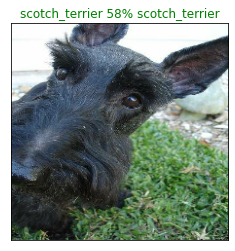

In [57]:
plot_pred(predictions, val_labels, val_images)

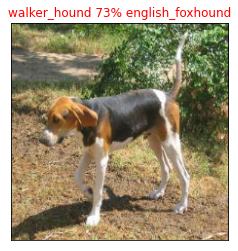

In [58]:
plot_pred(predictions, val_labels, val_images, 42)

##View our model's top 10 predictions for an image

In [59]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidence along with truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] # sort, take top10, in descending order
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  #change color of true
  if (np.isin(true_label, top_10_pred_labels)):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else :
    pass
  


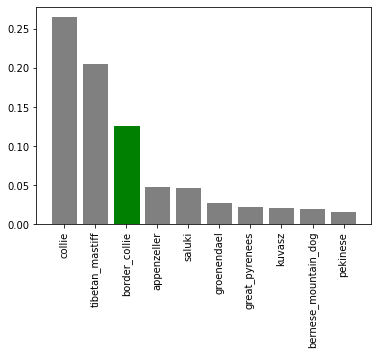

In [60]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

Let's check some predictions 

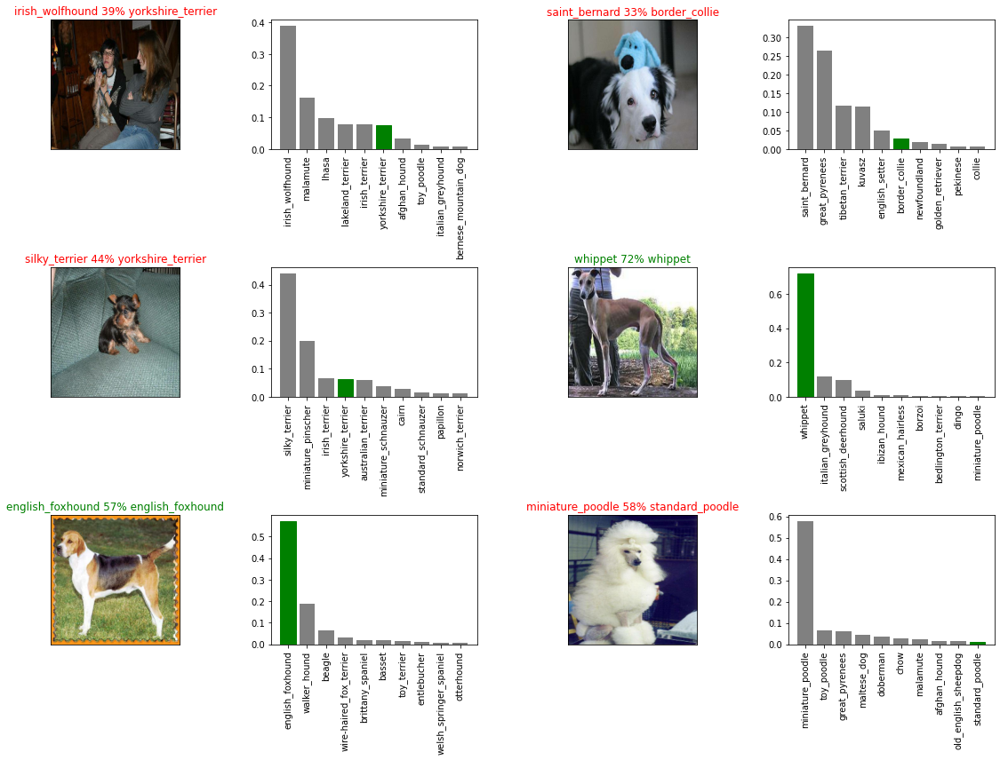

In [61]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(8*num_cols,4*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
            labels=val_labels,
            n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading our trained model

In [62]:
def save_model(model, suffix=None):
  """
  Saves a given model in our models directory and appends a suffix (string)
  """

  model_dir = os.path.join("drive/MyDrive/DogVision/models", 
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_dir + "-" + suffix + ".h5"

  print(f"Saving model to : {model_path} ...")
  model.save(model_path)
  return model_path



def load_model(model_path):
  """ 
  loads a saved model from a path
  """
  print(f"Loading model {model_path} ...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


In [63]:
# save our model trained on a 1000 images
save_model(model, suffix="1000-images-mobilenatV2-Adam")

Saving model to : drive/MyDrive/DogVision/models/20220201-18541643741647-1000-images-mobilenatV2-Adam.h5 ...


'drive/MyDrive/DogVision/models/20220201-18541643741647-1000-images-mobilenatV2-Adam.h5'

In [64]:
# load our model
loaded_1000_image_model = load_model("drive/MyDrive/DogVision/models/20220131-20391643661576-1000-images-mobilenatV2-Adam.h5")

Loading model drive/MyDrive/DogVision/models/20220131-20391643661576-1000-images-mobilenatV2-Adam.h5 ...


In [65]:
model.evaluate(val_data)

7/7 [==============================] - 1s 87ms/step - loss: 1.2032 - accuracy: 0.6700


[1.203192114830017, 0.6700000166893005]

In [66]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.3218 - accuracy: 0.6450


[1.3218491077423096, 0.6449999809265137]

## Train a model on the full dataset

In [67]:
len(X), len(y)

(10222, 10222)

In [68]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [69]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [81]:
len(full_data)*BATCH_SIZE

10240

In [71]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [72]:
full_model_tensorboard = create_tensorboard_callback()
# no validation on full data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running the cell below can take about 30 minutes

In [73]:
#full_model.fit(x=full_data, epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard, full_model_early_stopping])

In [74]:
#save_model(full_model, suffix="full-image-set-mobilenetV2-Adam")

In [75]:
full_model = load_model("drive/MyDrive/DogVision/models/20220131-21071643663259-full-image-set-mobilenetV2-Adam.h5")

Loading model drive/MyDrive/DogVision/models/20220131-21071643663259-full-image-set-mobilenetV2-Adam.h5 ...


## Making predictions on fully trained model (10k images in test dataset)

In [76]:
test_path = "drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DogVision/test/e5560686ee44dc59dbb99d6ef4ea54d8.jpg',
 'drive/MyDrive/DogVision/test/dfac7db18136057f5d1730c0055f875c.jpg',
 'drive/MyDrive/DogVision/test/e7afb35b8252782013a6700e28e327fa.jpg',
 'drive/MyDrive/DogVision/test/dcc047e682db75bbcebdec2288192f1d.jpg',
 'drive/MyDrive/DogVision/test/dca9642123204fd3df080147b05e4af3.jpg',
 'drive/MyDrive/DogVision/test/e0c767bc2bc03b909526f1861c712b13.jpg',
 'drive/MyDrive/DogVision/test/e78d3997b4e7f4abc1299f81b8e3b2d9.jpg',
 'drive/MyDrive/DogVision/test/e47de0441a48f2eff7c2faacd350ed06.jpg',
 'drive/MyDrive/DogVision/test/e6926a5046cd957245918c33985bcd62.jpg',
 'drive/MyDrive/DogVision/test/dd7bf84df93991b7c15ec739c82acc04.jpg']

In [77]:
len(test_filenames)

10357

In [78]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [80]:
len(test_data) * BATCH_SIZE

10368

In [82]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** this will take a long time to run (1h?)

In [83]:
#test_predictions = full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1678s 5s/step


In [84]:
#np.savetxt("drive/MyDrive/DogVision/test_preds_array.csv", test_predictions, delimiter=",")

In [85]:
test_predictions = np.loadtxt("drive/MyDrive/DogVision/test_preds_array.csv", delimiter=",")

In [89]:
test_predictions.shape

(10357, 120)

In [88]:
test_predictions[0]

array([1.14408049e-11, 1.10913828e-12, 2.83881446e-10, 1.00182276e-11,
       1.84830313e-07, 1.05309823e-07, 7.25796934e-09, 7.28311599e-04,
       1.93901322e-08, 6.80073128e-07, 2.23802032e-10, 4.61372807e-09,
       2.15063856e-09, 6.19514537e-08, 9.78982451e-10, 2.29143970e-09,
       1.66704694e-07, 5.56896662e-09, 5.09291880e-11, 2.76100725e-08,
       8.93524837e-11, 5.77187777e-12, 9.42182554e-10, 2.22273415e-11,
       3.16897399e-07, 2.55275689e-10, 3.29831429e-09, 4.30161454e-04,
       2.89559239e-08, 9.86578688e-03, 4.88333762e-10, 6.07143086e-11,
       1.17593296e-10, 6.43444686e-10, 2.35384490e-11, 9.21435317e-10,
       5.02819205e-07, 1.12987736e-05, 8.23649968e-11, 2.44345082e-11,
       1.38404774e-10, 2.79695572e-11, 1.67567400e-08, 3.99625833e-07,
       3.63132506e-12, 8.09627920e-09, 6.37866537e-10, 3.25613078e-11,
       1.58154791e-11, 2.40315856e-09, 9.53323087e-10, 1.30961797e-10,
       2.31539024e-11, 2.22297931e-08, 8.21506752e-11, 1.47763194e-05,
      